# 1. Image -> Image retrieval

### Imports

In [ ]:
# Standard library imports
import os
import random
import pickle
from collections import defaultdict
from concurrent.futures import ThreadPoolExecutor, as_completed

# Third-party imports
import numpy as np
import pandas as pd
import requests
import torch
import faiss
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
from tqdm import tqdm

# Hugging Face and transformers imports
from datasets import load_dataset, Dataset
from huggingface_hub import HfApi
from transformers import (
    CLIPProcessor, CLIPModel, CLIPTokenizer,
    BlipProcessor, BlipForConditionalGeneration,
    AutoProcessor, LlavaForConditionalGeneration
)

### Load the dataset `huggan/wikiart`

In [2]:
dataset = load_dataset("huggan/wikiart", split="train")

artist_numeric_class2label = {
    i: label for i, label in enumerate(dataset.features["artist"].names)
}
artist_label2numeric = {
    label: i for i, label in artist_numeric_class2label.items()
}

style_numeric_class2label = {
    i: label for i, label in enumerate(dataset.features["style"].names)
}
style_label2numeric = {
    label: i for i, label in style_numeric_class2label.items()
}

genre_numeric_class2label = {
    i: label for i, label in enumerate(dataset.features["genre"].names)
}
genre_label2numeric = {
    label: i for i, label in genre_numeric_class2label.items()
}

Resolving data files:   0%|          | 0/72 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/45 [00:00<?, ?it/s]

# 1.1 Choosing the model (image-encoder)
#### Why `openai/clip-vit-base-patch32`:
- very popular
- easy to use
- was trained on the data from the Internet (hence, was probably trained on the art as well)
- embeddings dimension is 512 which is good for the research purposes

In [3]:
MODEL_NAME: str = "openai/clip-vit-base-patch32"
clip_model = CLIPModel.from_pretrained(MODEL_NAME)
clip_processor = CLIPProcessor.from_pretrained(MODEL_NAME, use_fast=True)
clip_tokenizer = CLIPTokenizer.from_pretrained(MODEL_NAME)

print(f"Emb: {clip_model.config.projection_dim}")

Emb: 512


### Example of how to get image embedding

In [4]:
def encode_images(images: list[Image.Image]) -> np.ndarray:
    """Encodes a single image using CLIP model"""
    inputs = clip_processor(images=images, return_tensors="pt")
    with torch.no_grad():
        image_features = clip_model.get_image_features(**inputs)
    image_features = image_features / image_features.norm(dim=-1, keepdim=True)
    return image_features.cpu().numpy()

sample_image = dataset[0]["image"]
embeddings = encode_images([sample_image])
print("embeddings.shape:", embeddings.shape)
print("embeddings[0][:10]:", embeddings[0][:10])

embeddings.shape: (1, 512)
embeddings[0][:10]: [ 0.02603198 -0.02778844  0.00753939 -0.0316898   0.05780651  0.00213699
 -0.02586484  0.02895188 -0.02859055  0.01025531]


# 1.2 Build index (FAISS) using visual embeddings

In [5]:
def load_or_dump_embeddings(filename: str,  batch_size = 256):
    if os.path.exists(filename):
        with open(filename, "rb") as f:
            return pickle.load(f)

    embeddings = []

    for i in tqdm(range(0, len(dataset), batch_size), total=len(dataset) // batch_size, desc="Encoding images"):
        images = [dataset[i]["image"] for i in range(i, min(i+batch_size, len(dataset)))]
        embeddings.append(encode_images(images))

    embeddings = np.concatenate(embeddings, axis=0).astype('float32')
    with open(filename, "wb") as f:
        pickle.dump(embeddings, f)

    return embeddings

embeddings = load_or_dump_embeddings("data/image_embeddings.pkl")
dimension = embeddings.shape[1]  # 512 for CLIP

# Build FAISS index
visual_index = faiss.IndexFlatIP(dimension)  # Inner product (cosine similarity since embeddings are normalized)
visual_index.add(embeddings)

print(f"FAISS index built with {visual_index.ntotal} vectors")
print(f"Index type: {type(visual_index).__name__}")

FAISS index built with 81444 vectors
Index type: IndexFlatIP


# 1.3 Usage examples

Displaying 10 random query images with their 10 closest matches:


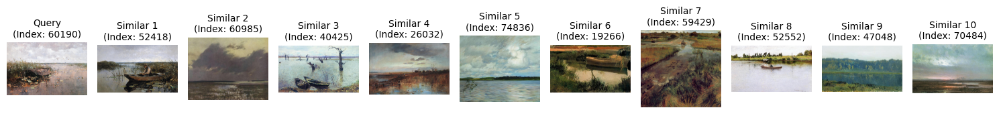

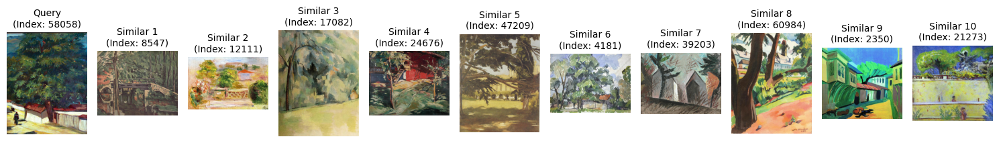

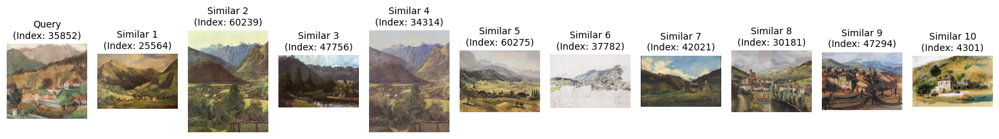

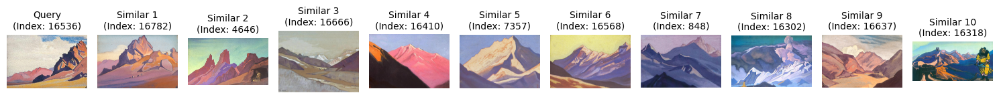

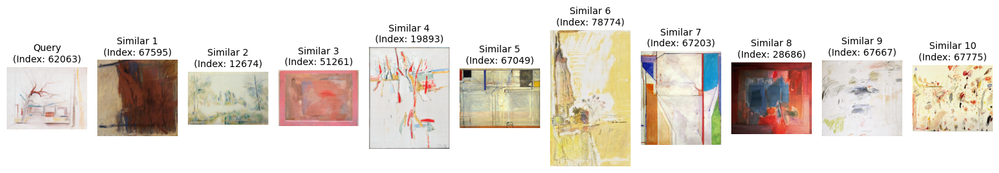

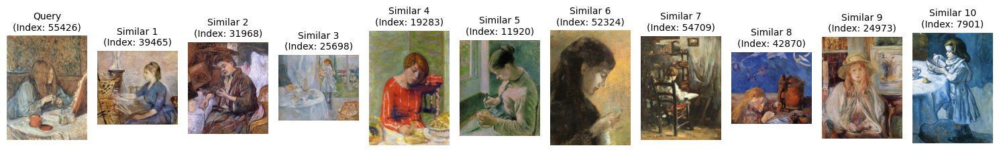

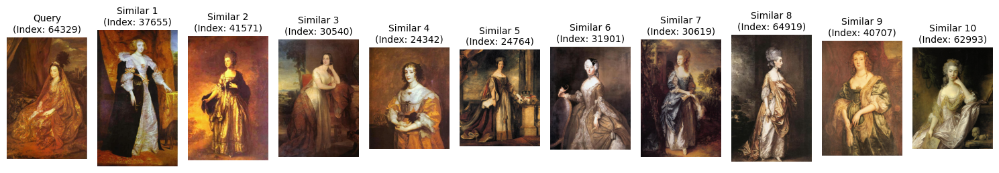

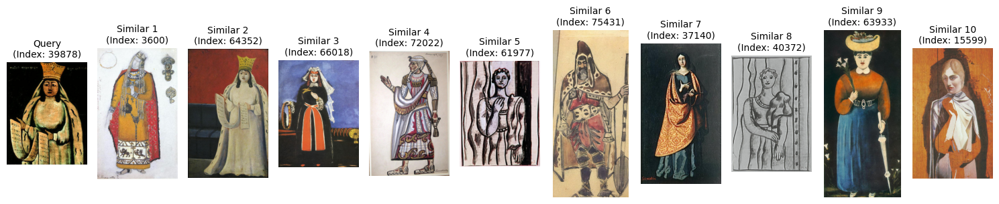

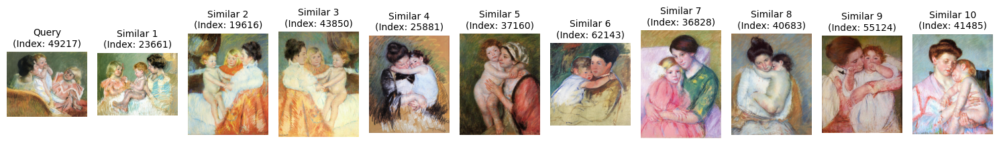

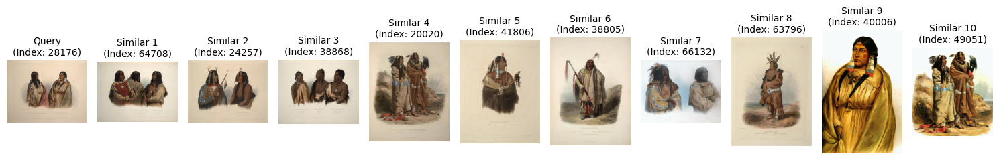

In [6]:
def find_close_images_by_visual_index(query_image: Image.Image, n_similar: int = 10):
    """Find n_similar closest images to the query image using FAISS index"""
    query_embedding = encode_images([query_image])
    scores, similar_indices = visual_index.search(query_embedding, n_similar + 1)
    similar_indices = similar_indices[0][1:]  # Remove first element
    similar_images = [dataset[idx]["image"] for idx in similar_indices]
    return similar_images, similar_indices

def get_random_images_and_similarities(n_queries=10, n_similar=10):
    """Select n_queries random images and find n_similar closest images for each"""
    query_indices = random.sample(range(len(dataset)), n_queries)
    results = []

    for query_idx in query_indices:
        query_image = dataset[query_idx]["image"]
        similar_images, similar_indices = find_close_images_by_visual_index(query_image, n_similar)
        results.append((query_idx, query_image, similar_indices, similar_images))
    
    return results

def plot_query_with_similarities(query_idx, query_image, similar_images, similar_indices, figsize=(15, 3)):
    """Plot query image with its 10 closest similar images"""
    fig, axes = plt.subplots(1, 11, figsize=figsize)
    
    # Plot query image
    axes[0].imshow(query_image)
    axes[0].set_title(f"Query\n(Index: {query_idx})", fontsize=10)
    axes[0].axis('off')
    
    # Plot similar images
    for i, (img, idx) in enumerate(zip(similar_images, similar_indices)):
        axes[i+1].imshow(img)
        axes[i+1].set_title(f"Similar {i+1}\n(Index: {idx})", fontsize=10)
        axes[i+1].axis('off')

    plt.tight_layout()
    plt.show()

def plot_all_results(results, max_queries=10):
    """Plot all query results"""
    for i, (query_idx, query_image, similar_indices, similar_images) in enumerate(results[:max_queries]):
        plot_query_with_similarities(query_idx, query_image, similar_images, similar_indices)


results = get_random_images_and_similarities(n_queries=10, n_similar=10)
print("Displaying 10 random query images with their 10 closest matches:")
print("=" * 60)
plot_all_results(results, max_queries=10)

# 2.1 Choosing the model for captioning

#### `Salesforce/blip-image-captioning-base`:
- Lightweight and efficient
- Specifically designed for image captioning


In [7]:
from transformers import AutoTokenizer, AutoImageProcessor, VisionEncoderDecoderModel
import requests, time
from PIL import Image

CAPTION_MODEL_NAME = "Salesforce/blip-image-captioning-base"
caption_model = BlipForConditionalGeneration.from_pretrained(CAPTION_MODEL_NAME)
caption_processor = BlipProcessor.from_pretrained(CAPTION_MODEL_NAME, use_fast=True)

print(f"Caption model loaded: {CAPTION_MODEL_NAME}")

# get model number of parameters
print(f"Number of parameters: {caption_model.num_parameters() // 1e6:.0f}M")

Caption model loaded: Salesforce/blip-image-captioning-base
Number of parameters: 223M


### Example of how to generate captions


Sample image caption:   a painting of trees and a lake
Original image info:    Artist: vincent-van-gogh, Style: Realism, Genre: landscape


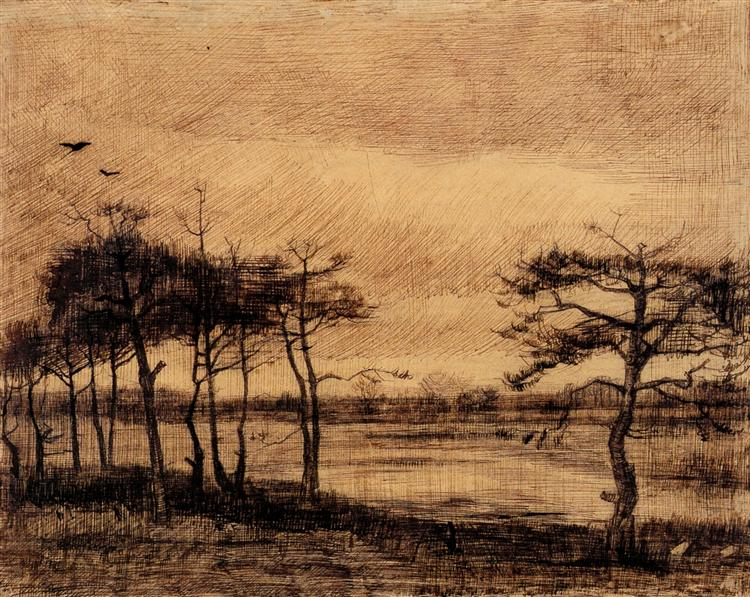

In [8]:
def generate_captions(images: list[Image.Image]) -> list[str]:
    """Generate captions for a list of images using BLIP model"""
    inputs = caption_processor(images, return_tensors="pt")
    
    with torch.no_grad():
        out = caption_model.generate(**inputs, max_length=50)
    
    captions = caption_processor.batch_decode(out, skip_special_tokens=True)
    return captions

# Test caption generation on a sample image
sample_image = dataset[0]["image"]
sample_captions = generate_captions([sample_image])

print(f"Sample image caption:   {sample_captions[0]}")
print(f"Original image info:    Artist: {artist_numeric_class2label[dataset[0]['artist']]}, Style: {style_numeric_class2label[dataset[0]['style']]}, Genre: {genre_numeric_class2label[dataset[0]['genre']]}")

sample_image

# 2. Caption→Image Retrieval

# 2.2 Generate captions for the dataset and show examples


In [9]:
def load_or_dump_captions(filename: str):
    if os.path.exists(filename):
        with open(filename, "rb") as f:
            return pickle.load(f)

    batch_size = 16
    all_captions = []

    for i in tqdm(range(0, len(dataset), batch_size), total=len(dataset) // batch_size, desc="Generating captions"):
        images = [dataset[j]["image"] for j in range(i, min(i+batch_size, len(dataset)))]
        captions = generate_captions(images)
        all_captions.extend(captions)
        # Dump every 100 steps
        if (i // batch_size + 1) % 100 == 0:
            with open(filename, "wb") as f:
                pickle.dump(all_captions, f)

    with open(filename, "wb") as f:
        pickle.dump(all_captions, f)

    return all_captions

captions_data = load_or_dump_captions("data/captions.pkl")

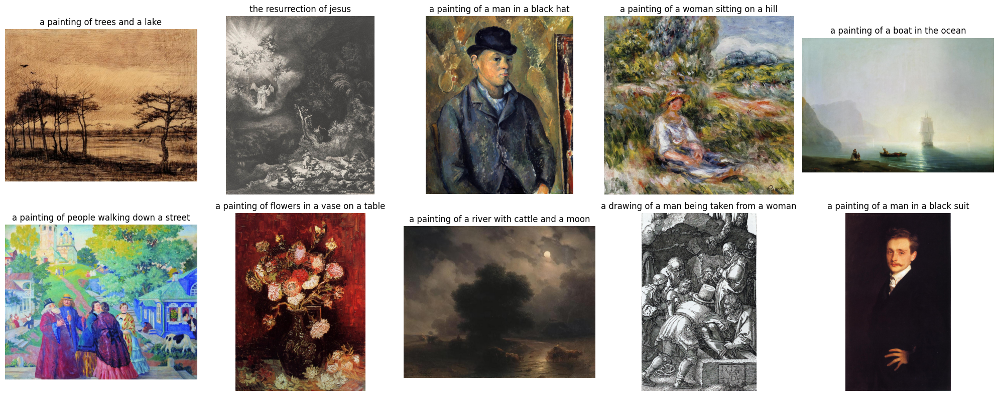

In [10]:
fig, axes = plt.subplots(2, 5, figsize=(20, 8))
axes = axes.flatten()
for i in range(min(10, len(captions_data))):
    caption = captions_data[i]
    item = dataset[i]
    ax = axes[i]
    ax.imshow(item['image'])
    ax.set_title(caption, fontsize=12, wrap=True)
    ax.axis('off')
plt.tight_layout()
plt.show()

# 2.3 Build caption-based search index

Now we'll use CLIP to encode the generated captions and build a search index. This allows us to search for images by text queries that are semantically similar to the captions.


In [11]:
def encode_texts(texts: list[str]) -> np.ndarray:
    """Encode texts using CLIP text encoder"""
    inputs = clip_tokenizer(texts, return_tensors="pt", padding=True, truncation=True)
    with torch.no_grad():
        text_features = clip_model.get_text_features(**inputs)
    text_features = text_features / text_features.norm(dim=-1, keepdim=True)
    return text_features.cpu().numpy()


def load_or_dump_text_embeddings(filename: str, texts: list[str]) -> np.ndarray:
    """Encode texts using CLIP text encoder or load from file if it exists"""
    if os.path.exists(filename):
        with open(filename, "rb") as f:
            return pickle.load(f)

    embeddings = []
    batch_size = 256

    for i in tqdm(range(0, len(texts), batch_size), total=len(texts) // batch_size, desc="Encoding captions"):
        batch_texts = texts[i:min(i+batch_size, len(texts))]
        batch_embeddings = encode_texts(batch_texts)
        embeddings.append(batch_embeddings)
    
    embeddings = np.concatenate(embeddings, axis=0).astype('float32')
    with open(filename, "wb") as f:
        pickle.dump(embeddings, f)

    return embeddings

caption_embeddings = load_or_dump_text_embeddings("data/caption_embeddings.pkl", captions_data)
# Build FAISS index for captions
caption_index = faiss.IndexFlatIP(caption_embeddings.shape[1])
caption_index.add(caption_embeddings.astype('float32'))

print(f"Caption FAISS index built with {caption_index.ntotal} vectors")

Caption FAISS index built with 81444 vectors


# 2.4 Demonstrate caption-based image retrieval


Displaying 10 random query images with their 10 closest matches by caption similarity:


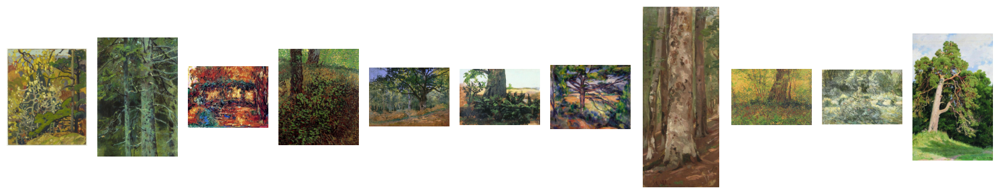

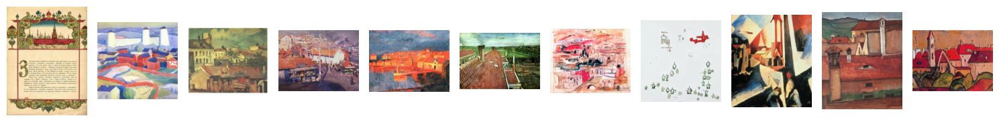

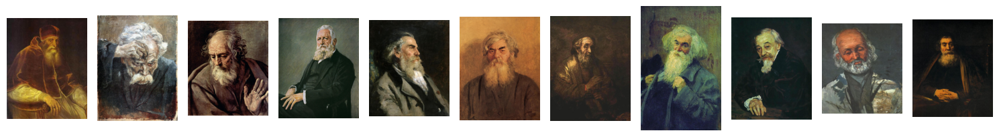

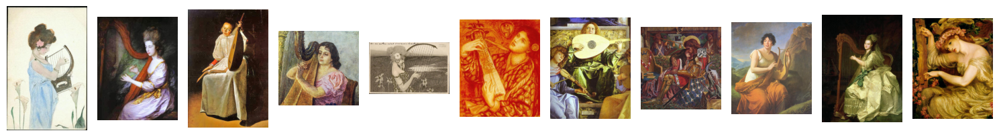

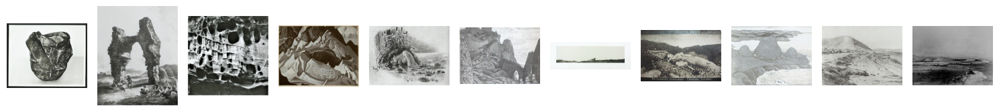

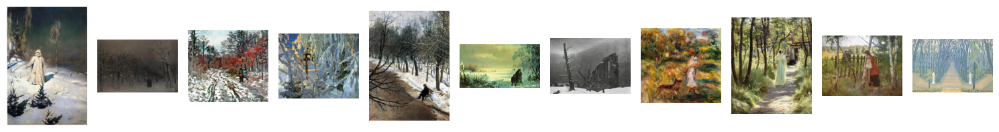

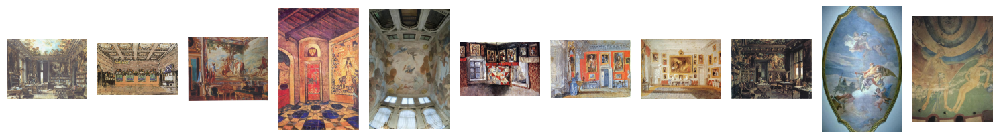

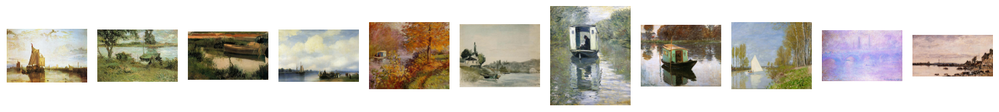

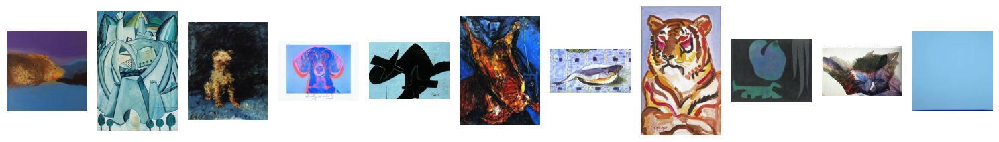

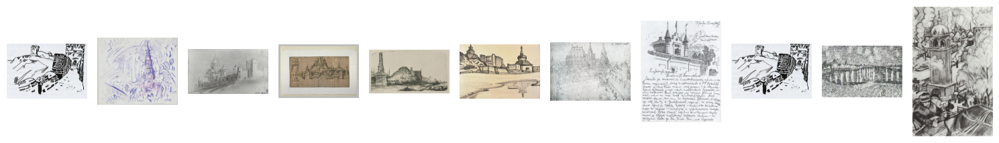

In [12]:
def find_close_images_by_caption_index(query_caption: str, n_similar: int = 10):
    """Find n_similar closest images to the query caption using FAISS index"""
    query_caption_emb = encode_texts([query_caption]).astype('float32')
    scores, similar_indices = caption_index.search(query_caption_emb, n_similar + 1)
    similar_indices = similar_indices[0][1:]  # Remove first element
    similar_images = [dataset[idx]["image"] for idx in similar_indices]
    return similar_images, similar_indices

def get_random_images_and_similarities(n_queries=10, n_similar=10):
    query_indices = random.sample(range(len(captions_data)), n_queries)
    results = []

    for query_idx in query_indices:
        # Get query image and its caption
        query_item = captions_data[query_idx]
        query_image = dataset[query_idx]["image"]
        query_caption = captions_data[query_idx]

        similar_images, similar_indices = find_close_images_by_caption_index(query_caption, n_similar)
        similar_captions = [captions_data[idx] for idx in similar_indices]

        results.append((query_idx, query_image, similar_indices, similar_images, query_caption, similar_captions))
    
    return results

def plot_query_with_similarities(query_idx, query_image, similar_images, similar_indices, query_caption=None, similar_captions=None, figsize=(15, 3)):
    """Plot query image with its 10 closest similar images"""
    fig, axes = plt.subplots(1, 11, figsize=figsize)
    
    # Plot query image
    axes[0].imshow(query_image)
    axes[0].axis('off')
    
    # Plot similar images
    for i, (img, idx) in enumerate(zip(similar_images, similar_indices)):
        axes[i+1].imshow(img)
        axes[i+1].axis('off')

    plt.tight_layout()
    plt.show()

def plot_all_results(results, max_queries=10):
    """Plot all query results"""
    for i, (query_idx, query_image, similar_indices, similar_images, query_caption, similar_captions) in enumerate(results[:max_queries]):
        plot_query_with_similarities(query_idx, query_image, similar_images, similar_indices, query_caption, similar_captions)


# Run and visualize
caption_retrieval_results = get_random_images_and_similarities(n_queries=10, n_similar=10)
print("Displaying 10 random query images with their 10 closest matches by caption similarity:")
print("=" * 80)
plot_all_results(caption_retrieval_results, max_queries=10)

# Analysis

It is easy to notice that many images have very similar captions (which makes them close in the FAISS index based on captions), but are actually quite different in terms of color palette or brushwork.

# 2.5 Publish dataset with captions to HuggingFace Datasets

### `https://huggingface.co/datasets/NikolaiSkripko/wikiart-captions`


In [ ]:
def prepare_dataset_for_upload(captions_data):
    """
    Prepare caption data for HuggingFace dataset upload.

    Args:
        captions_data (list): List of caption strings.

    Returns:
        df (pd.DataFrame): DataFrame with image_idx and caption columns.
        hf_dataset (datasets.Dataset): HuggingFace Dataset object.
    """
    data = {
        "image_idx": list(range(len(captions_data))),
        "caption": captions_data,
    }
    df = pd.DataFrame(data)
    hf_dataset = Dataset.from_pandas(df)
    return df, hf_dataset

def upload_dataset_to_hub(captions_data, dataset_id, local_csv_path='data/wikiart_captions.csv'):
    """
    Uploads the dataset to HuggingFace Hub if not already present.

    Args:
        captions_data (list): List of caption strings.
        dataset_id (str): HuggingFace dataset repo id.
        local_csv_path (str): Path to save the local CSV file.
    """
    api = HfApi()
    try:
        api.dataset_info(dataset_id)
        print(f"\nDataset '{dataset_id}' already exists on the HuggingFace Hub. Skipping upload.")
        return
    except Exception:
        print(f"\nDataset '{dataset_id}' not found on the HuggingFace Hub. Uploading now...")

    # Set your HuggingFace token (ensure this is handled securely in production)
    # os.environ["HF_TOKEN"] = "..."

    # Prepare the dataset
    df, hf_dataset = prepare_dataset_for_upload(captions_data)

    print(f"Dataset prepared with {len(df)} samples")
    print("\nSample data:")
    print(df.head())
    print("\nDataset features:")
    print(hf_dataset.features)

    # Save locally
    df.to_csv(local_csv_path, index=False)
    print(f"\nDataset saved as '{local_csv_path}'")

    # Push to HuggingFace Hub
    hf_dataset.push_to_hub(dataset_id)
    print(f"Dataset uploaded to https://huggingface.co/datasets/{dataset_id}")


upload_dataset_to_hub(captions_data, "NikolaiSkripko/wikiart-captions")


Dataset 'NikolaiSkripko/wikiart-captions' already exists on the HuggingFace Hub. Skipping upload.


# 3. Omni→Image Retrieval

In [14]:
model_id = "llava-hf/llava-1.5-7b-hf"

# Check for MPS device
if torch.backends.mps.is_available():
    device = torch.device("mps")
    print("Using MPS device.")
else:
    device = torch.device("cpu")
    print("MPS not available, using CPU.")

# Load model and send to device
lava_model = LlavaForConditionalGeneration.from_pretrained(
    model_id,
    dtype=torch.bfloat16,
    low_cpu_mem_usage=True
).to(device)  # Send model to the appropriate device

lava_processor = AutoProcessor.from_pretrained(model_id, use_fast=True)

Using MPS device.


Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

In [15]:
# Prepare chat template for all images
conversation = [
    {
      "role": "user",
      "content": [
          {"type": "text", "text": "3 tags"},  # the simplest prompt is used due to computational resources
                                               # Of course, it's better to expand it.
          {"type": "image"},
        ],
    },
]
prompt = lava_processor.apply_chat_template(conversation, add_generation_prompt=True)

all_tags = []
save_path = "data/image_tags.csv"

# If resuming, load previous results
if os.path.exists(save_path):
    df_tags = pd.read_csv(save_path)
    start_idx = len(df_tags)
    all_tags = df_tags["tags"].tolist()
    processed_indices = set(df_tags["idx"].tolist())
else:
    df_tags = pd.DataFrame(columns=["idx", "tags"])
    start_idx = 0
    processed_indices = set()

num_images = len(dataset)

In [16]:
def process_image(idx):
    image = dataset[idx]["image"]
    # Prepare input for a single image
    inputs = lava_processor(
        images=[image],
        text=[prompt],
        return_tensors='pt',
        padding=True
    ).to(0, torch.bfloat16)
    with torch.inference_mode():
        output = lava_model.generate(
            **inputs,
            max_new_tokens=10,
            do_sample=False,
            num_beams=1,
            pad_token_id=lava_processor.tokenizer.eos_token_id
        )
    tags_raw = lava_processor.decode(output[0][2:], skip_special_tokens=True)
    assistant_starts_idx = tags_raw.find("ASSISTANT:")
    tags = tags_raw[assistant_starts_idx+len("ASSISTANT:"):].strip().lower().replace(",", " ").split() if assistant_starts_idx != -1 else []
    tag_str = " ".join(tags)
    return idx, tag_str

# Only process images that haven't been processed yet
indices_to_process = [i for i in range(num_images) if i not in processed_indices]

for count, idx in tqdm(enumerate(indices_to_process), total=len(indices_to_process)):
    idx, tag_str = process_image(idx)
    all_tags.append(tag_str)
    df_tags = pd.concat([df_tags, pd.DataFrame([{"idx": idx, "tags": tag_str}])], ignore_index=True)
    # print(f"Processed idx={idx}: {tag_str}")
    # Save every 10 steps or at the end
    if ((count + 1) % 10 == 0) or (count + 1 == len(indices_to_process)):
        df_tags.to_csv(save_path, index=False)
        # print(f"Saved tags for {len(df_tags)} images to {save_path}")

0it [00:00, ?it/s]


# 3.1 Implement multimodal image search function


In [ ]:
def load_or_dump_genre_to_image_ids(filename: str):
    if os.path.exists(filename):
        with open(filename, "rb") as f:
            return pickle.load(f)

    # Vectorized approach to speed up genre_to_image_ids construction
    genres = np.array([item["genre"] for item in dataset])
    indices = np.arange(len(dataset))
    genre_to_image_ids = defaultdict(list)
    for genre in tqdm(np.unique(genres), total=len(np.unique(genres))):
        genre_to_image_ids[genre] = indices[genres == genre].tolist()

    # dump genre_to_image_ids to data/genre_to_image_ids.pkl
    with open("data/genre_to_image_ids.pkl", "wb") as f:
        pickle.dump(genre_to_image_ids, f)

numeric_genre_to_image_ids = load_or_dump_genre_to_image_ids("data/genre_to_image_ids.pkl")
genre_to_image_ids = {genre_numeric_class2label[genre_class]: ids for genre_class, ids in numeric_genre_to_image_ids.items()}

def find_images_by_genre(genre: str) -> list[int]:
    """
    Find images by genre.
    """
    
    return genre_to_image_ids[genre]

def multimodal_retrieval(query_image: Image.Image = None, query_text: str = None, genre: str = None, tags: list[str] = None, n: int = 10):
    """A multimodal retrieval:
    0. start with found_images = []
    1. if a query image is provided, find the most similar images by visual index (say 100): found_images.extend(similar_images)
    2. if a query text is provided, find the most similar images by caption index (say 100): found_images.extend(similar_images)
    3. if a genre is provided and found_images is empty, then keep only images from the genre: found_images = genre_to_image_ids[genre]
    4. if a genre is provided and found_images is not empty, then keep only images from the genre: found_images = [i for i in found_images if dataset[i]["genre"] == genre]
    5. if tags are provided, then keep only images that have at least 1 tag in common: found_images = [i for i in found_images if any(tag in dataset[i]["tags"] for tag in tags)]
    6. return found_images
    """
    found_images = set()

    # 1. Visual search
    if query_image is not None:
        _, similar_indices = find_close_images_by_visual_index(query_image, 100)
        found_images.update(similar_indices)

    # 2. Caption/text search
    if query_text is not None and query_text.strip() != "":
        _, similar_indices = find_close_images_by_caption_index(query_text, 100)
        found_images.update(similar_indices)

    # If neither image nor text provided, start with all images
    if not found_images:
        found_images = set(range(len(dataset)))

    # 3. Filter by genre
    if genre is not None and genre.strip() != "":
        genre_ids = set(find_images_by_genre(genre))
        found_images = found_images & genre_ids

    # 4. Filter by tags
    if tags is not None and len(tags) > 0:
        filtered = set()
        for idx in found_images:
            img_tags = df_tags[df_tags["idx"] == idx]["tags"].values[0].split()
            if any(tag in img_tags for tag in tags):
                filtered.add(idx)
        found_images = filtered

    return random.sample(list(found_images), min(n, len(found_images)))


def plot_images(image_ids: list[int]):
    n_images = len(image_ids)
    n_cols = 5
    n_rows = (n_images + n_cols - 1) // n_cols
    # Each image will be 4x4 inches
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 4, n_rows * 4))
    # axes could be 1D or 2D depending on n_rows
    axes = np.array(axes).reshape(n_rows, n_cols)
    for idx, image_id in enumerate(image_ids):
        row = idx // n_cols
        col = idx % n_cols
        axes[row, col].imshow(dataset[image_id]["image"])
        axes[row, col].axis("off")
    # Hide any unused axes
    for idx in range(len(image_ids), n_rows * n_cols):
        row = idx // n_cols
        col = idx % n_cols
        axes[row, col].axis("off")
    plt.tight_layout()
    plt.show()

# Usage example

### Input:
- genre: `landscape`
- query_text: `a very dark night`
- tags: `["river", "tree"]`
- query_image: see below

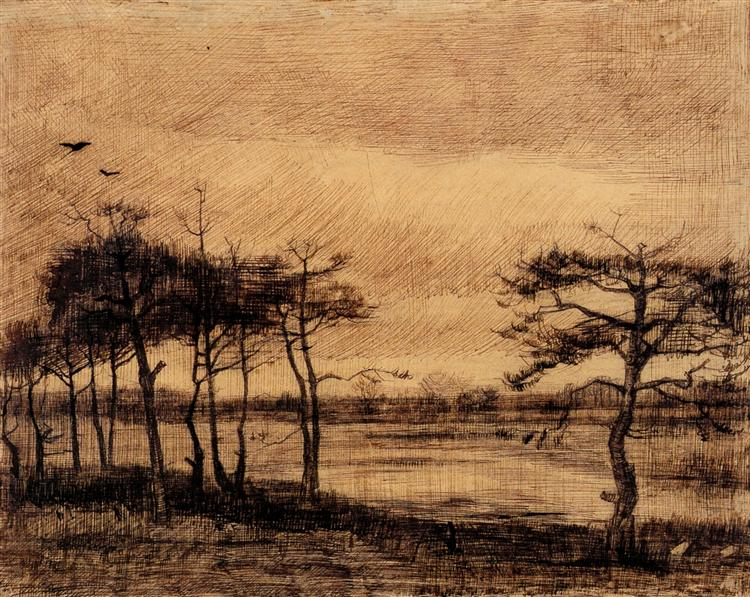

In [18]:
dataset[0]["image"]

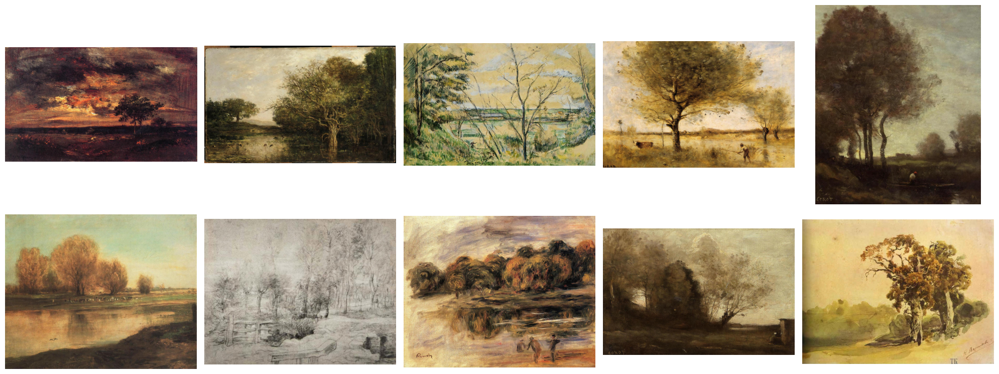

In [19]:
image_ids = multimodal_retrieval(genre="landscape", query_image=dataset[0]["image"], query_text="a very dark night", tags=["river", "tree"])
plot_images(image_ids)

### The result is awesome: every part of the input search is present: river, tree, landscape, dark night + similar to the input image